In [1]:
import pytorch_lightning as pl
import numpy as np
import torch
import os
import torchvision.transforms as t
import ipywidgets as widgets
import matplotlib.pyplot as plt
from PIL import Image

os.chdir('../')

from src.data import SimpleDataset
from src.model import AdaInModel

## Utilities

In [2]:
# Data transformations
resize_size = 0
crop_size = 256

if resize_size == 0:
    transforms = t.Compose(
        [
            t.CenterCrop(crop_size),
            t.ToTensor(),
        ]
    )
else:
    transforms = t.Compose(
        [
            t.Resize(resize_size),
            t.CenterCrop(crop_size),
            t.ToTensor(),
        ]
    )

In [3]:
def grid_visualize(imgs, titles=['Content', 'Style', 'Output']):
    n = len(imgs)
    plt.figure(figsize=(n*5, 10))

    for i, (img, title) in enumerate(zip(imgs, titles)):
        if len(img.size()) == 4:
            img = img.squeeze(0)
            
        plt.subplot(1,n,i+1)
        plt.axis('off')
        plt.title(title)
        plt.imshow(img.permute(1,2,0).numpy())

    plt.tight_layout()
    plt.show()

# Style Transfer with Content and Style Images

In [4]:
# Select content and style images
content_dir = "data/midog/1/"
style_dir = "data/midog/4/"
style = {'description_width': 'initial'}
c_widget = widgets.Dropdown(description='Content Image:', options=sorted(os.listdir(content_dir)), style=style)
s_widget = widgets.Dropdown(description='Style Image:', options=sorted(os.listdir(style_dir)), style=style)

display(c_widget)
display(s_widget)

Dropdown(description='Content Image:', options=('001.tiff', '002.tiff', '003.tiff', '004.tiff', '005.tiff', '0…

Dropdown(description='Style Image:', options=('151.tiff', '152.tiff', '153.tiff', '154.tiff', '155.tiff', '156…

In [5]:
# Load images
content_path = os.path.join(content_dir, c_widget.value)
style_path = os.path.join(style_dir, s_widget.value)

#content_path = os.path.join(content_dir, "010.tiff")
#style_path = os.path.join(style_dir, "160.tiff")


content_img = transforms(Image.open(os.path.join(content_path)).convert("RGB"))
style_img = transforms(Image.open(os.path.join(style_path)).convert("RGB"))

In [18]:
s1_1 = transforms(Image.open(os.path.join(content_dir, "011.tiff")).convert("RGB"))
s1_2 = transforms(Image.open(os.path.join(content_dir, "030.tiff")).convert("RGB"))
s1_3 = transforms(Image.open(os.path.join(content_dir, "040.tiff")).convert("RGB"))

s2_1 = transforms(Image.open(os.path.join("../data/midog/2/", "061.tiff")).convert("RGB"))
s2_2 = transforms(Image.open(os.path.join("../data/midog/2/", "090.tiff")).convert("RGB"))
s2_3 = transforms(Image.open(os.path.join("../data/midog/2/", "095.tiff")).convert("RGB"))

s3_1 = transforms(Image.open(os.path.join("../data/midog/3/", "111.tiff")).convert("RGB"))
s3_2 = transforms(Image.open(os.path.join("../data/midog/3/", "130.tiff")).convert("RGB"))
s3_3 = transforms(Image.open(os.path.join("../data/midog/3/", "140.tiff")).convert("RGB"))

s4_1 = transforms(Image.open(os.path.join("../data/midog/4/", "161.tiff")).convert("RGB"))
s4_2 = transforms(Image.open(os.path.join("../data/midog/4/", "190.tiff")).convert("RGB"))
s4_3 = transforms(Image.open(os.path.join("../data/midog/4/", "197.tiff")).convert("RGB"))

from torchvision.utils import make_grid, save_image
grid = make_grid([s1_1, s2_1, s3_1, s4_1], nrow=2, pad_value=1)
save_image(s4_3, "1.png")

In [6]:
with torch.no_grad():
    s1_out, _, _ = skip_model(s1_1.unsqueeze(0), s4_3.unsqueeze(0))
    s2_out, _, _ = skip_model(s2_1.unsqueeze(0), s4_3.unsqueeze(0))
    s3_out, _, _ = skip_model(s3_1.unsqueeze(0), s4_3.unsqueeze(0))
    s4_out, _, _ = skip_model(s4_1.unsqueeze(0), s4_3.unsqueeze(0))

grid = make_grid([s1_out[0], s2_out[0], s3_out[0], s4_out[0]], nrow=2)
save_image(grid, "2.png")

NameError: name 'skip_model' is not defined

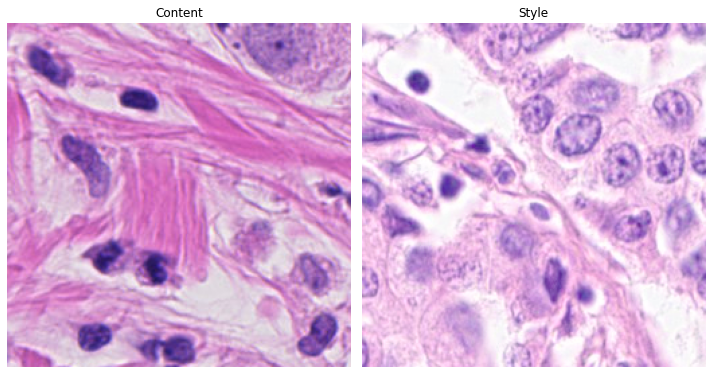

In [11]:
# Visualize images
grid_visualize([content_img, style_img])

In [7]:
# Load models
adain_checkpoint = "output/adain_vanilla/version_0/checkpoints/epoch=13049-step=78299.ckpt"
bfg_checkpoint = "output/adain_bfg/version_0/checkpoints/epoch=12799-step=76799.ckpt"
skip_checkpoint = "output/adain_skip/version_0/checkpoints/epoch=12649-step=75899.ckpt"
#skip_checkpoint = "output/all_scanners/version_0/checkpoints/epoch=6499-step=71499.ckpt"

#adain_checkpoint = "checkpoints/vanilla.ckpt"
#bfg_checkpoint = "checkpoints/bfg.ckpt"
#skip_checkpoint = "checkpoints/skip.ckpt"

adain_model = AdaInModel().load_from_checkpoint(adain_checkpoint)
bfg_model = AdaInModel().load_from_checkpoint(bfg_checkpoint)
skip_model = AdaInModel().load_from_checkpoint(skip_checkpoint)

/home/ben/.local/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


## AdaIn

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


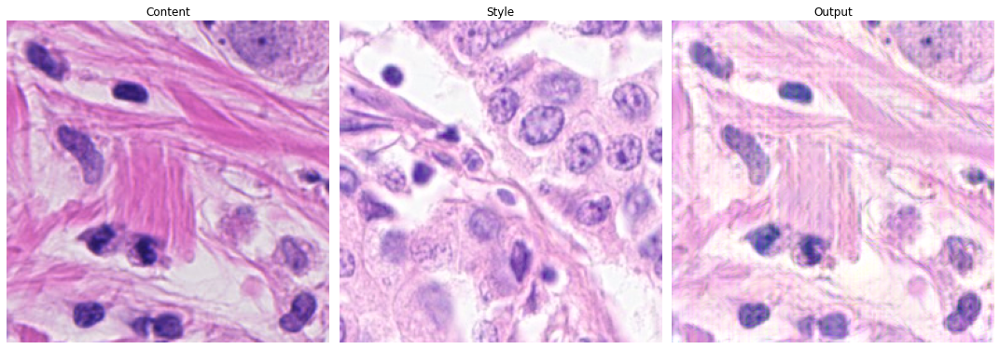

In [8]:
# Vanilla AdaIn
with torch.no_grad():
    out_vanilla, _, _ = adain_model(content_img.unsqueeze(0), style_img.unsqueeze(0))
out_vanilla = out_vanilla.detach()
grid_visualize([content_img, style_img, out_vanilla])

## AdaIn with BFG

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


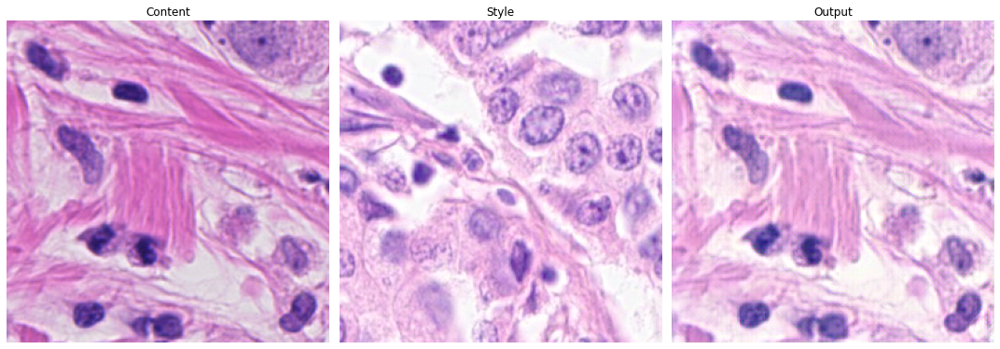

In [9]:
# AdaIn w/ BFG
with torch.no_grad():
    out_bfg, _, _ = bfg_model(content_img.unsqueeze(0), style_img.unsqueeze(0))
out_bfg = out_bfg.detach()
grid_visualize([content_img, style_img, out_bfg])

## AdaIn with BFG + Skip Connections

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


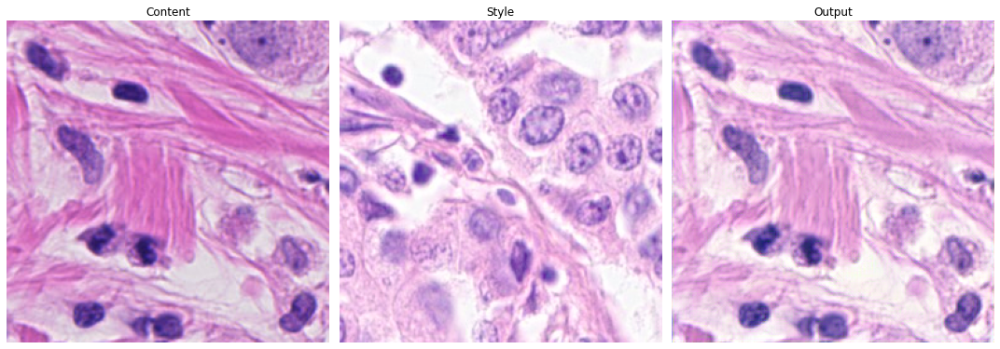

In [10]:
# AdaIn w/ BFG + Skip Connections
with torch.no_grad():
    out_skip, _, _ = skip_model(content_img.unsqueeze(0), style_img.unsqueeze(0))
out_skip = out_skip.detach()
grid_visualize([content_img, style_img, out_skip])

## Model Comparison

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


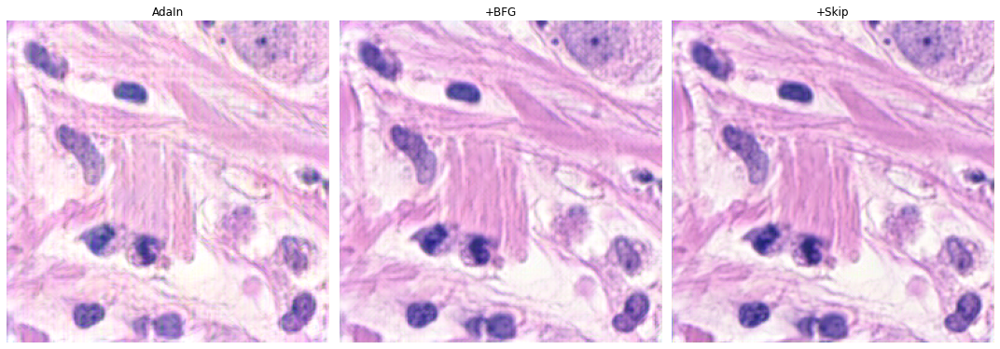

In [11]:
grid_visualize([out_vanilla, out_bfg, out_skip], titles=["AdaIn", "+BFG", "+Skip"])

## Different Style Images

In [12]:
s1_widget = widgets.Dropdown(description='Style Image 1:', options=sorted(os.listdir(style_dir)), style=style)
s2_widget = widgets.Dropdown(description='Style Image 2:', options=sorted(os.listdir(style_dir)), style=style)
s3_widget = widgets.Dropdown(description='Style Image 3:', options=sorted(os.listdir(style_dir)), style=style)

display(s1_widget)
display(s2_widget)
display(s3_widget)

Dropdown(description='Style Image 1:', options=('151.tiff', '152.tiff', '153.tiff', '154.tiff', '155.tiff', '1…

Dropdown(description='Style Image 2:', options=('151.tiff', '152.tiff', '153.tiff', '154.tiff', '155.tiff', '1…

Dropdown(description='Style Image 3:', options=('151.tiff', '152.tiff', '153.tiff', '154.tiff', '155.tiff', '1…

In [13]:
style_path1 = os.path.join(style_dir, s1_widget.value)
style_path2 = os.path.join(style_dir, s2_widget.value)
style_path3 = os.path.join(style_dir, s3_widget.value)

style_img1 = transforms(Image.open(os.path.join(style_path1)).convert("RGB"))
style_img2 = transforms(Image.open(os.path.join(style_path2)).convert("RGB"))
style_img3 = transforms(Image.open(os.path.join(style_path3)).convert("RGB"))

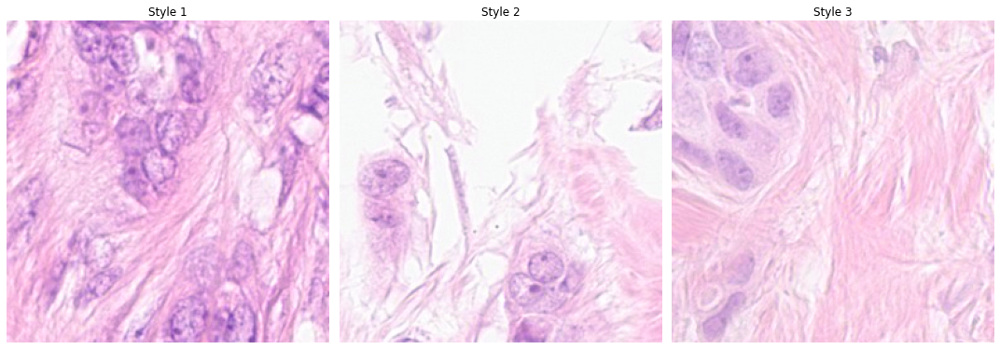

In [14]:
grid_visualize([style_img1, style_img2, style_img3], titles=["Style 1", "Style 2", "Style 3"])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


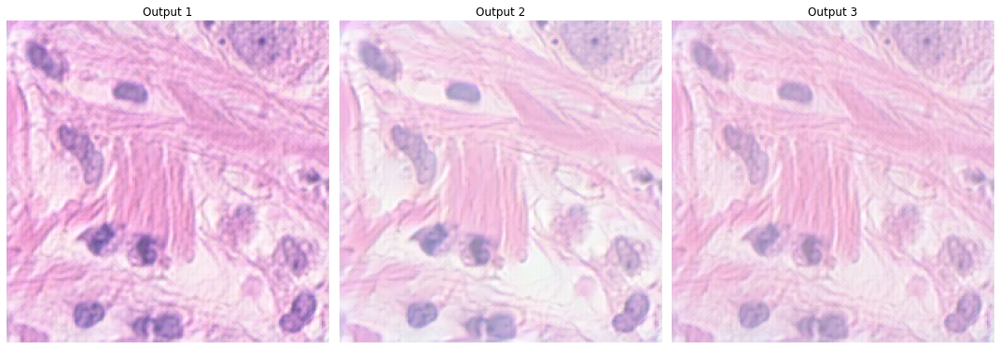

In [15]:
with torch.no_grad():
    out_bfg1, _, _ = bfg_model(content_img.unsqueeze(0), style_img1.unsqueeze(0))
    out_bfg2, _, _ = bfg_model(content_img.unsqueeze(0), style_img2.unsqueeze(0))
    out_bfg3, _, _ = bfg_model(content_img.unsqueeze(0), style_img3.unsqueeze(0))

out_bfg1 = out_bfg1.detach()
out_bfg2 = out_bfg2.detach()
out_bfg3 = out_bfg3.detach()

grid_visualize([out_bfg1, out_bfg2, out_bfg3], titles=["Output 1", "Output 2", "Output 3"])

## Style Images from Different Scanners

In [35]:
dir1 = "data/midog/1/"
dir2 = "data/midog/2/"
dir3 = "data/midog/3/"
dir4 = "data/midog/4/"


s1_widget = widgets.Dropdown(description='Style Scanner 1:', options=sorted(os.listdir(dir1)), style=style)
s2_widget = widgets.Dropdown(description='Style Scanner 2:', options=sorted(os.listdir(dir2)), style=style)
s3_widget = widgets.Dropdown(description='Style Scanner 3:', options=sorted(os.listdir(dir3)), style=style)
s4_widget = widgets.Dropdown(description='Style Scanner 4:', options=sorted(os.listdir(dir4)), style=style)

display(s1_widget)
display(s2_widget)
display(s3_widget)
display(s4_widget)

Dropdown(description='Style Scanner 1:', options=('001.tiff', '002.tiff', '003.tiff', '004.tiff', '005.tiff', …

Dropdown(description='Style Scanner 2:', options=('051.tiff', '052.tiff', '053.tiff', '054.tiff', '055.tiff', …

Dropdown(description='Style Scanner 3:', options=('101.tiff', '102.tiff', '103.tiff', '104.tiff', '105.tiff', …

Dropdown(description='Style Scanner 4:', options=('151.tiff', '152.tiff', '153.tiff', '154.tiff', '155.tiff', …

In [36]:
style_path1 = os.path.join(dir1, s1_widget.value)
style_path2 = os.path.join(dir2, s2_widget.value)
style_path3 = os.path.join(dir3, s3_widget.value)
style_path4 = os.path.join(dir4, s4_widget.value)

style_img1 = transforms(Image.open(os.path.join(style_path1)).convert("RGB"))
style_img2 = transforms(Image.open(os.path.join(style_path2)).convert("RGB"))
style_img3 = transforms(Image.open(os.path.join(style_path3)).convert("RGB"))
style_img4 = transforms(Image.open(os.path.join(style_path4)).convert("RGB"))

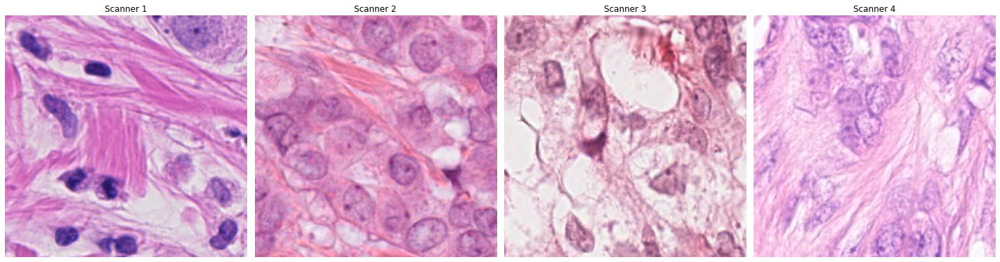

In [37]:
grid_visualize([style_img1, style_img2, style_img3, style_img4], 
               titles=["Scanner 1", "Scanner 2", "Scanner 3", "Scanner 4"])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


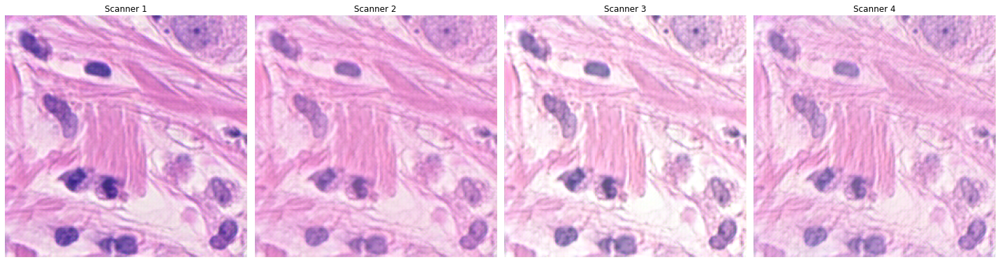

In [38]:
with torch.no_grad():
    out_bfg1, _, _ = bfg_model(content_img.unsqueeze(0), style_img1.unsqueeze(0))
    out_bfg2, _, _ = bfg_model(content_img.unsqueeze(0), style_img2.unsqueeze(0))
    out_bfg3, _, _ = bfg_model(content_img.unsqueeze(0), style_img3.unsqueeze(0))
    out_bfg4, _, _ = bfg_model(content_img.unsqueeze(0), style_img4.unsqueeze(0))
    

out_bfg1 = out_bfg1.detach()
out_bfg2 = out_bfg2.detach()
out_bfg3 = out_bfg3.detach()
out_bfg4 = out_bfg4.detach()

grid_visualize([out_bfg1, out_bfg2, out_bfg3, out_bfg4], 
               titles=["Scanner 1", "Scanner 2", "Scanner 3", "Scanner 4"])

In [40]:
from torchvision.utils import save_image, make_grid

grid = make_grid([
    style_img1.squeeze(0),
    style_img2.squeeze(0),
    style_img3.squeeze(0),
    style_img4.squeeze(0),
], nrow=1)

save_image(grid, "s.png")

## Content Images from Different Scanners

In [25]:
c1_widget = widgets.Dropdown(description='Content Scanner 1:', options=sorted(os.listdir(dir1)), style=style)
c2_widget = widgets.Dropdown(description='Content Scanner 2:', options=sorted(os.listdir(dir2)), style=style)
c3_widget = widgets.Dropdown(description='Content Scanner 3:', options=sorted(os.listdir(dir3)), style=style)
c4_widget = widgets.Dropdown(description='Content Scanner 4:', options=sorted(os.listdir(dir4)), style=style)

display(c1_widget)
display(c2_widget)
display(c3_widget)
display(c4_widget)

Dropdown(description='Content Scanner 1:', options=('001.tiff', '002.tiff', '003.tiff', '004.tiff', '005.tiff'…

Dropdown(description='Content Scanner 2:', options=('051.tiff', '052.tiff', '053.tiff', '054.tiff', '055.tiff'…

Dropdown(description='Content Scanner 3:', options=('101.tiff', '102.tiff', '103.tiff', '104.tiff', '105.tiff'…

Dropdown(description='Content Scanner 4:', options=('151.tiff', '152.tiff', '153.tiff', '154.tiff', '155.tiff'…

In [26]:
content_path1 = os.path.join(dir1, c1_widget.value)
content_path2 = os.path.join(dir2, c2_widget.value)
content_path3 = os.path.join(dir3, c3_widget.value)
content_path4 = os.path.join(dir4, c4_widget.value)

content_img1 = transforms(Image.open(os.path.join(content_path1)).convert("RGB"))
content_img2 = transforms(Image.open(os.path.join(content_path2)).convert("RGB"))
content_img3 = transforms(Image.open(os.path.join(content_path3)).convert("RGB"))
content_img4 = transforms(Image.open(os.path.join(content_path4)).convert("RGB"))

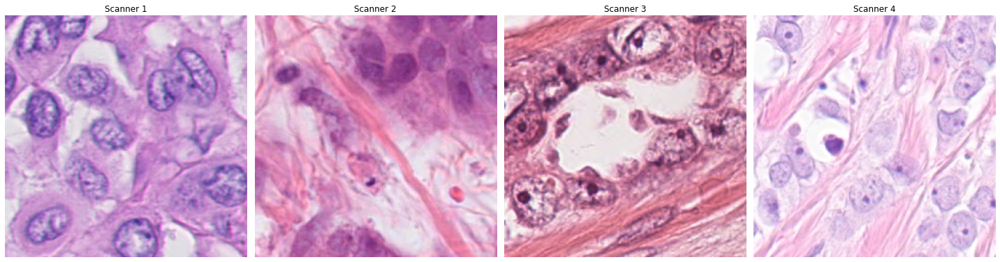

In [27]:
grid_visualize([content_img1, content_img2, content_img3, content_img4], 
               titles=["Scanner 1", "Scanner 2", "Scanner 3", "Scanner 4"])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


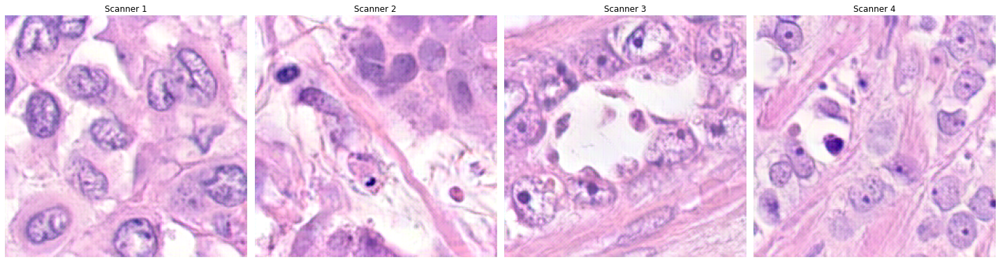

In [28]:
with torch.no_grad():
    out_bfg1, _, _ = bfg_model(content_img1.unsqueeze(0), style_img.unsqueeze(0))
    out_bfg2, _, _ = bfg_model(content_img2.unsqueeze(0), style_img.unsqueeze(0))
    out_bfg3, _, _ = bfg_model(content_img3.unsqueeze(0), style_img.unsqueeze(0))
    out_bfg4, _, _ = bfg_model(content_img4.unsqueeze(0), style_img.unsqueeze(0))
    

out_bfg1 = out_bfg1.detach()
out_bfg2 = out_bfg2.detach()
out_bfg3 = out_bfg3.detach()
out_bfg4 = out_bfg4.detach()

grid_visualize([out_bfg1, out_bfg2, out_bfg3, out_bfg4], 
               titles=["Scanner 1", "Scanner 2", "Scanner 3", "Scanner 4"])

In [34]:
from torchvision.utils import save_image, make_grid

grid = make_grid([
    out_bfg1.squeeze(0),
    out_bfg2.squeeze(0),
    out_bfg3.squeeze(0),
    out_bfg4.squeeze(0),
], nrow=1)

save_image(grid, "out.png")

## Same Content and Style Image

In [ ]:
with torch.no_grad():
    out_bfg, _, _ = bfg_model(style_img.unsqueeze(0), style_img.unsqueeze(0))
    
out_bfg = out_bfg.detach()

grid_visualize([style_img, out_bfg], titles=["Original", "Output"])

## Using Predefined Style Features

In [ ]:
#avg_feats = torch.load("data/scanner4_features.pt")
avg_feats = torch.load("checkpoints/scanner4_features.pt")


with torch.no_grad():
    out, _, _ = bfg_model(content_img.unsqueeze(0), style_img.unsqueeze(0))
    out_avg, _, _ = bfg_model.net(content_img.unsqueeze(0), f_s=avg_feats)
    
out = out.detach()
out_avg = out_avg.detach()

grid_visualize([content_img, style_img, out, out_avg], titles=["Content", "Style", "Output", "Avg Features"])

In [ ]:
const_feats = []
for f in avg_feats:
    const_feats.append(torch.zeros_like(f).squeeze(0))

with torch.no_grad():
    out_ones, _, _ = bfg_model.net(content_img.unsqueeze(0), f_s=const_feats)
    
out_ones = out_ones.detach()

grid_visualize([content_img, style_img, out, out_ones], titles=["Content", "Style", "Output", "Constant Features"])

In [ ]:
rand_feats = []
for f in avg_feats:
    rand_feats.append((torch.rand_like(f)*2-1).squeeze(0))

with torch.no_grad():
    out_rand, _, _ = bfg_model.net(content_img.unsqueeze(0), f_s=rand_feats)
    
out_ones = out_ones.detach()

grid_visualize([content_img, style_img, out, out_rand], titles=["Content", "Style", "Output", "Random Features"])